<a href="https://colab.research.google.com/github/Sarah-0405/Cold_Spots_Bayern/blob/main/Quartile_Cold_Spot_Klassifizierung.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install contextily

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 81.8 MB/s eta 0:00:00


In [3]:
from sklearn.neighbors import NearestNeighbors
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
import contextily as ctx

In [4]:
import geopandas as gpd

In [5]:
geojson_path = '/content/drive/MyDrive/Cold Spots Bayern/averaged_lst_per_pixel_per_city_allyears.geojson'
gdf = gpd.read_file(geojson_path)

display(gdf.head())

,city,avg_summer_LST_Celsius,geometry
0,Aschaffenburg,25.827932,POINT (9.23257 49.93527)
1,Aschaffenburg,25.828958,POINT (9.2355 49.935)
2,Aschaffenburg,25.846390,POINT (9.2355 49.93527)
3,Aschaffenburg,25.713771,POINT (9.23591 49.935)
4,Aschaffenburg,25.751711,POINT (9.23591 49.93527)


# Task
Lade die GeoJSON-Datei "/content/drive/MyDrive/Cold Spots Bayern/averaged_lst_per_pixel_per_city_allyears.geojson" und führe die folgenden Schritte durch: Berechne für jede Stadt das erste Quartil (Q1) der 'avg_summer_LST_Celsius'-Werte. Klassifiziere Pixel mit LST-Werten innerhalb des Q1 der jeweiligen Stadt als "Cold Spot" und weise ihnen die Eigenschaft Q1 zu. Führe eine Dichte- und Clusteranalyse (z.B. DBSCAN) auf den als "Cold Spot" klassifizierten Pixeln durch, um räumlich zusammenhängende Cluster zu identifizieren. Gib eine Schritt-für-Schritt-Anleitung für diesen Prozess, wobei du Parameter, die sorgfältig gewählt werden müssen (wie `eps` und `min_samples` bei DBSCAN), explizit kennzeichnest.

## Berechnung des ersten quartils (q1) pro stadt

### Subtask:
Berechnen Sie für jede Stadt in der Spalte 'city' das erste Quartil (Q1) der 'avg_summer_LST_Celsius'-Werte.


**Reasoning**:
Group the geodataframe by 'city' and calculate the first quartile for the 'avg_summer_LST_Celsius' for each city.



In [6]:
q1_per_city = gdf.groupby('city')['avg_summer_LST_Celsius'].quantile(q=0.25)
display(q1_per_city)

,avg_summer_LST_Celsius
city,
Aschaffenburg,26.578302
Augsburg,28.918345
Bamberg,29.891474
Bayreuth,32.179981
Erlangen,32.241932
Fürth,32.913324
Ingolstadt,31.515532
Kempten (Allgäu),31.000194
Landshut,30.294195


## Klassifizierung der pixel

### Subtask:
Fügen Sie eine neue Spalte zum GeoDataFrame hinzu, die angibt, ob der LST-Wert eines Pixels innerhalb des ersten Quartils (Q1) der jeweiligen Stadt liegt. Diese Pixel werden als potenzielle "Cold Spots" klassifiziert.


**Reasoning**:
Add a new column 'is_cold_spot' to the GeoDataFrame and populate it based on whether the 'avg_summer_LST_Celsius' is within the first quartile for each city.



In [7]:
gdf['is_cold_spot'] = gdf.apply(lambda row: row['avg_summer_LST_Celsius'] <= q1_per_city[row['city']], axis=1)
display(gdf.head())

,city,avg_summer_LST_Celsius,geometry,is_cold_spot
0,Aschaffenburg,25.827932,POINT (9.23257 49.93527),True
1,Aschaffenburg,25.828958,POINT (9.2355 49.935),True
2,Aschaffenburg,25.846390,POINT (9.2355 49.93527),True
3,Aschaffenburg,25.713771,POINT (9.23591 49.935),True
4,Aschaffenburg,25.751711,POINT (9.23591 49.93527),True


## Vorbereitung für die dichte- und clusteranalyse

### Subtask:
Extrahieren Sie die Koordinaten der als potenzielle "Cold Spots" klassifizierten Pixel für die Dichte- und Clusteranalyse.


**Reasoning**:
Filter the geodataframe to keep only cold spots and extract their coordinates.



In [8]:
cold_spots_gdf = gdf[gdf['is_cold_spot'] == True]
coordinates = cold_spots_gdf.geometry.apply(lambda geom: (geom.x, geom.y)).tolist()

## Dichte-basierte räumliche clusteranalyse (z.b. dbscan)

### Subtask:
Führen Sie eine Dichte-basierte Clusteranalyse (wie DBSCAN) auf den extrahierten Koordinaten durch, um räumlich zusammenhängende "Cold Spots" zu identifizieren. **Wichtig:** Bei DBSCAN müssen Parameter wie `eps` (maximaler Abstand zwischen zwei Stichproben, damit eine als zur gleichen Nachbarschaft gehörend betrachtet wird) und `min_samples` (Anzahl der Stichproben in einer Nachbarschaft für einen Punkt, um als Kernpunkt zu gelten) sorgfältig gewählt werden. Diese Parameter beeinflussen maßgeblich die Größe und Anzahl der identifizierten Cluster und sollten basierend auf der räumlichen Auflösung Ihrer Daten und der Definition eines "Cold Spots" in Ihrem Kontext festgelegt werden.


**Reasoning**:
Import the DBSCAN class from sklearn.cluster and then instantiate a DBSCAN object with chosen parameters and fit it to the coordinates.



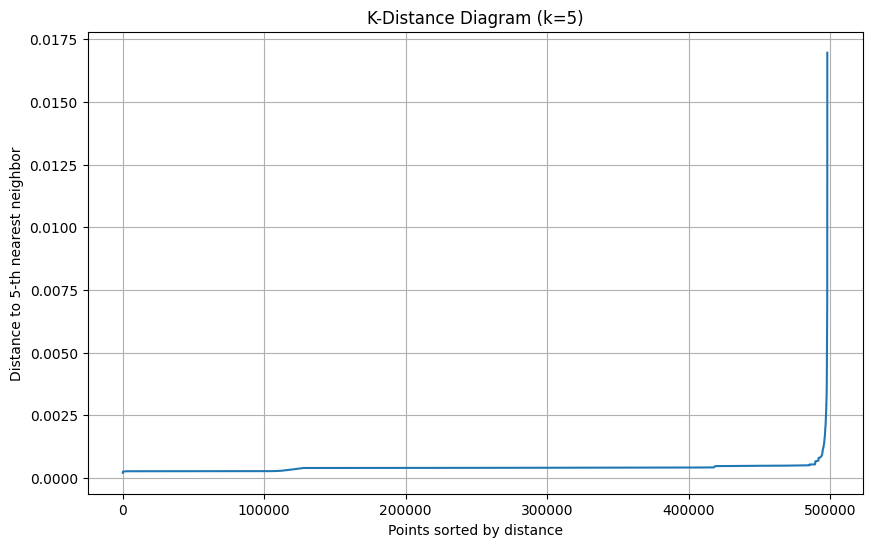

In [9]:
# Choose a value for k (often min_samples)
# Let's start with k = 8 as you considered earlier, but you might want to experiment with this.
k = 5

# Use NearestNeighbors to find the k-nearest neighbors
neigh = NearestNeighbors(n_neighbors=k)
neigh.fit(coordinates)

# Find the distances to the k-nearest neighbors
distances, indices = neigh.kneighbors(coordinates)

# Sort the distances in ascending order
distances = np.sort(distances[:, k-1], axis=0)

# Plot the k-distance diagram
plt.figure(figsize=(10, 6))
plt.plot(distances)
plt.xlabel('Points sorted by distance')
plt.ylabel(f'Distance to {k}-th nearest neighbor')
plt.title(f'K-Distance Diagram (k={k})')
plt.grid(True)
plt.show()

In [10]:
from sklearn.cluster import DBSCAN

# Define eps and min_samples based on the k-distance plot and your choice
eps = 0.002  # Maximum distance between two samples for one to be considered as in the neighborhood of the other
min_samples = 5 # The number of samples in a neighborhood for a point to be considered as a core point (including the point itself)

# Apply DBSCAN
dbscan = DBSCAN(eps=eps, min_samples=min_samples)
clusters = dbscan.fit_predict(coordinates)

# Add the cluster labels to the cold_spots_gdf GeoDataFrame
# To avoid SettingWithCopyWarning, we explicitly create a copy
cold_spots_gdf = cold_spots_gdf.copy()
cold_spots_gdf['cluster'] = clusters

# Display the first few rows with the new cluster column
display(cold_spots_gdf.head())

# Display the number of points in each cluster (excluding noise, labeled as -1)
display(cold_spots_gdf['cluster'].value_counts())

,city,avg_summer_LST_Celsius,geometry,is_cold_spot,cluster
0,Aschaffenburg,25.827932,POINT (9.23257 49.93527),True,0
1,Aschaffenburg,25.828958,POINT (9.2355 49.935),True,0
2,Aschaffenburg,25.846390,POINT (9.2355 49.93527),True,0
3,Aschaffenburg,25.713771,POINT (9.23591 49.935),True,0
4,Aschaffenburg,25.751711,POINT (9.23591 49.93527),True,0


,count
cluster,
131,29120
241,25581
258,23142
492,22829
408,21739
...,...
91,5
94,5
92,5


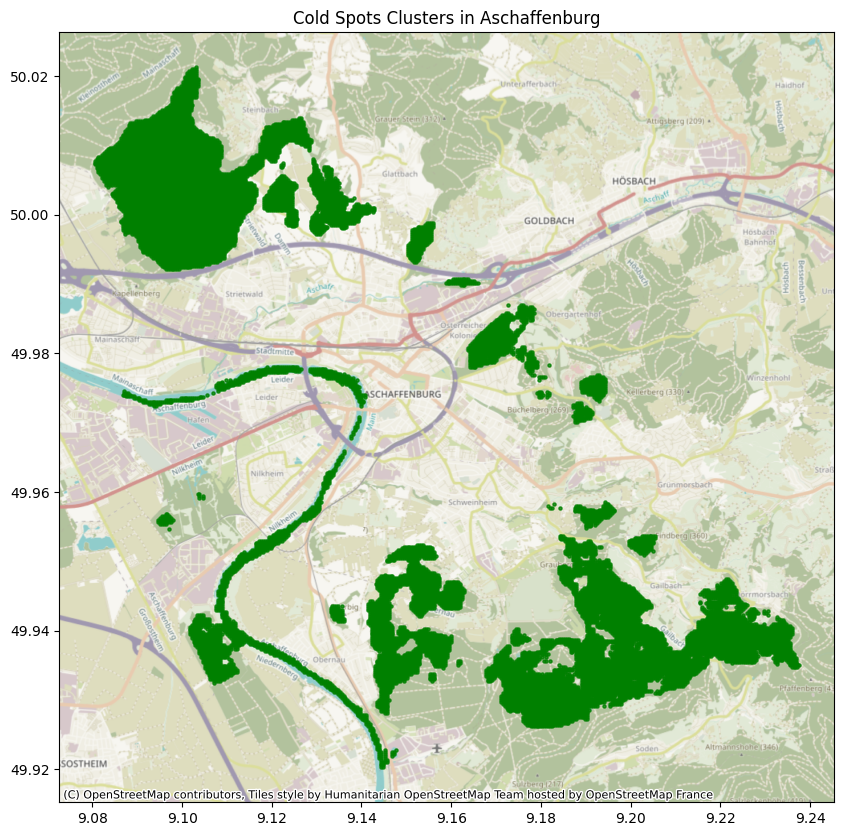

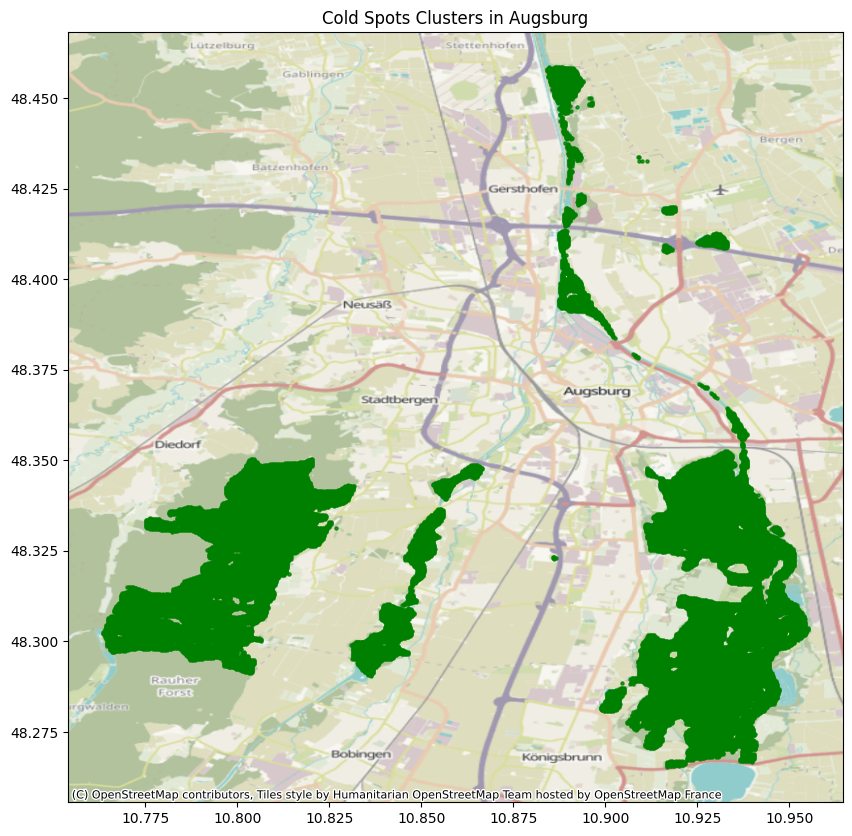

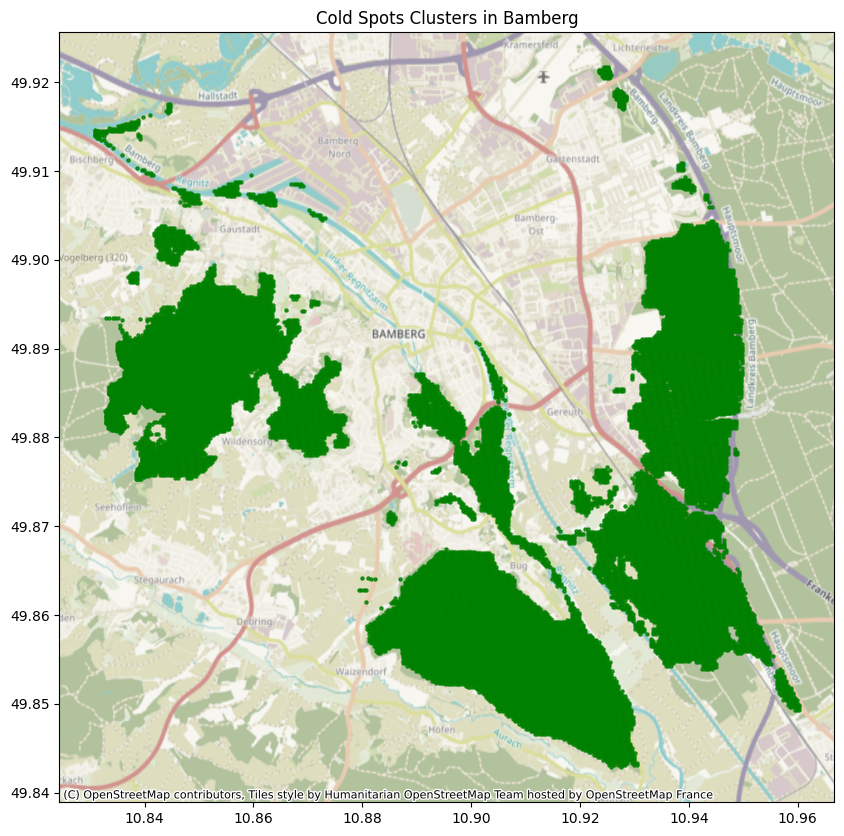

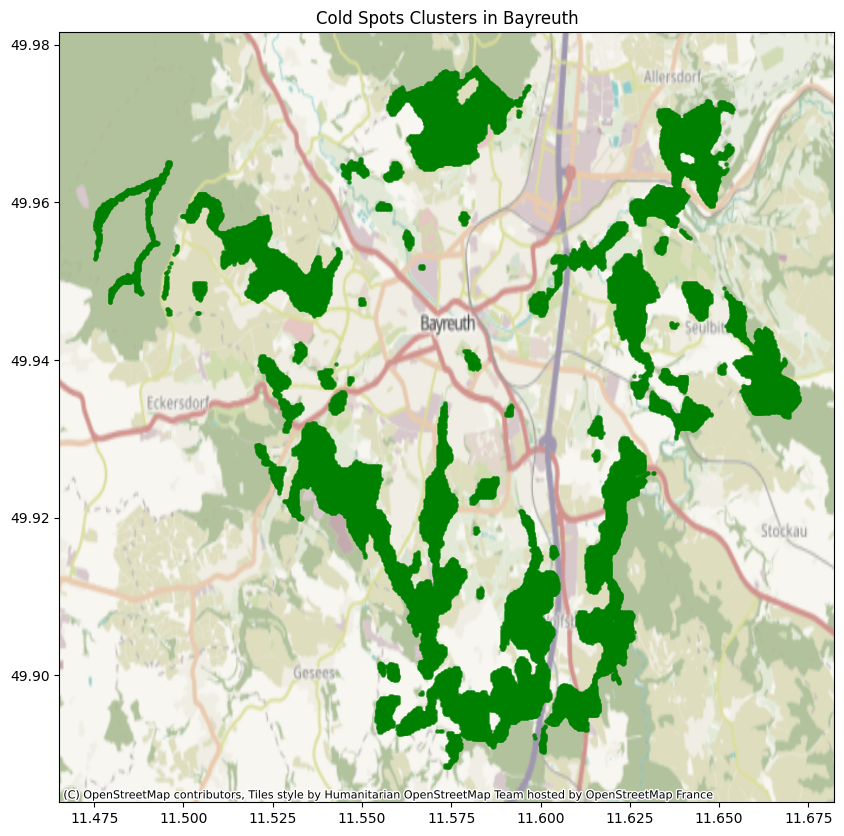

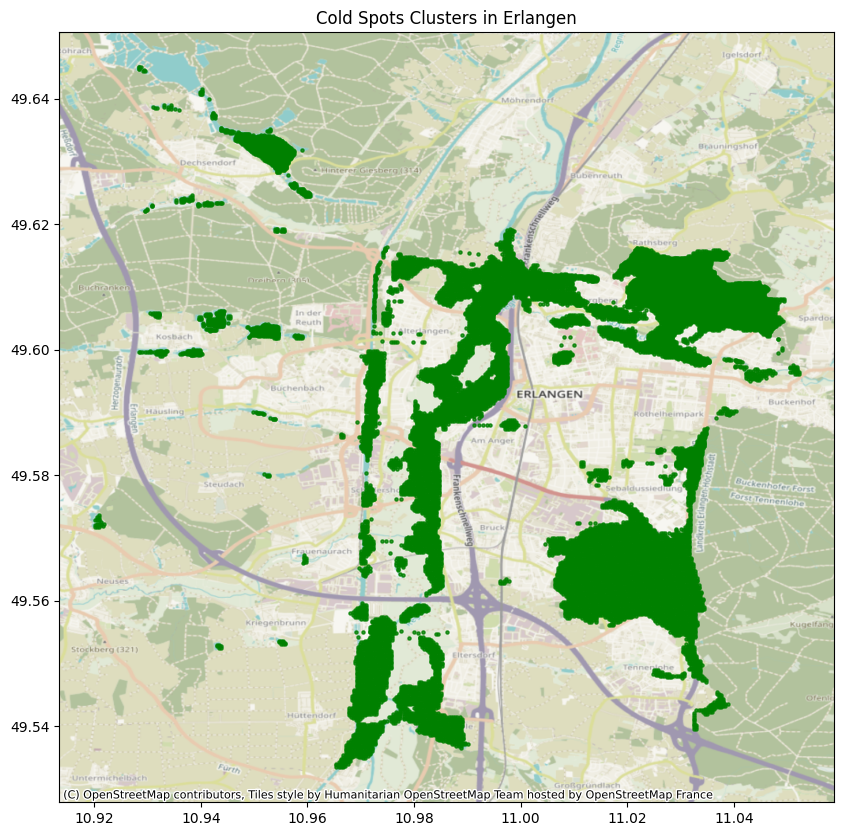

...

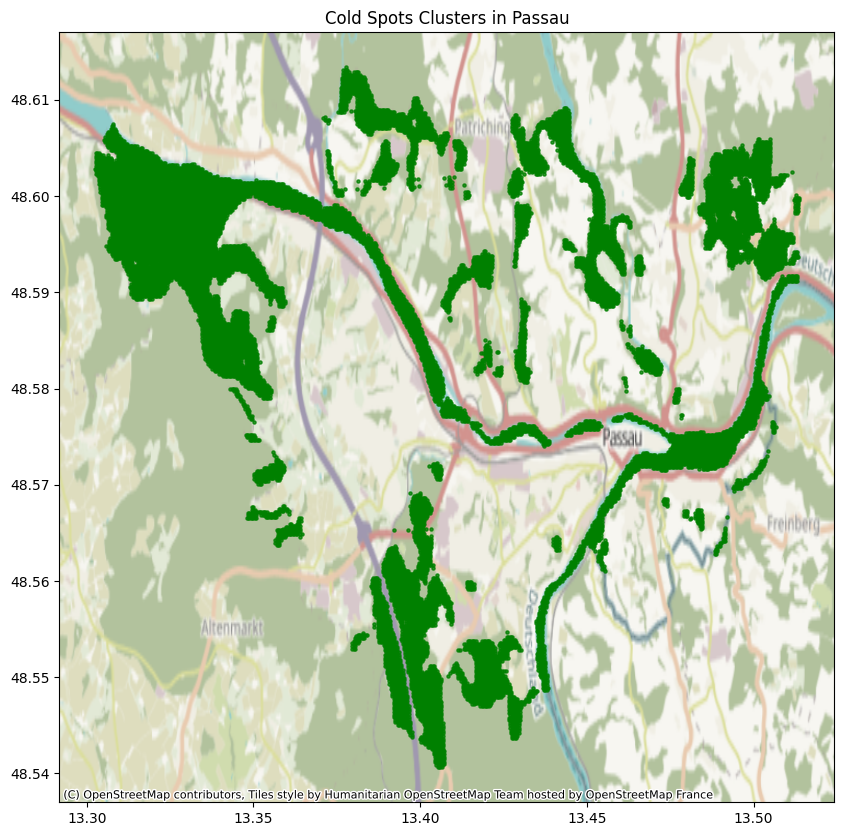

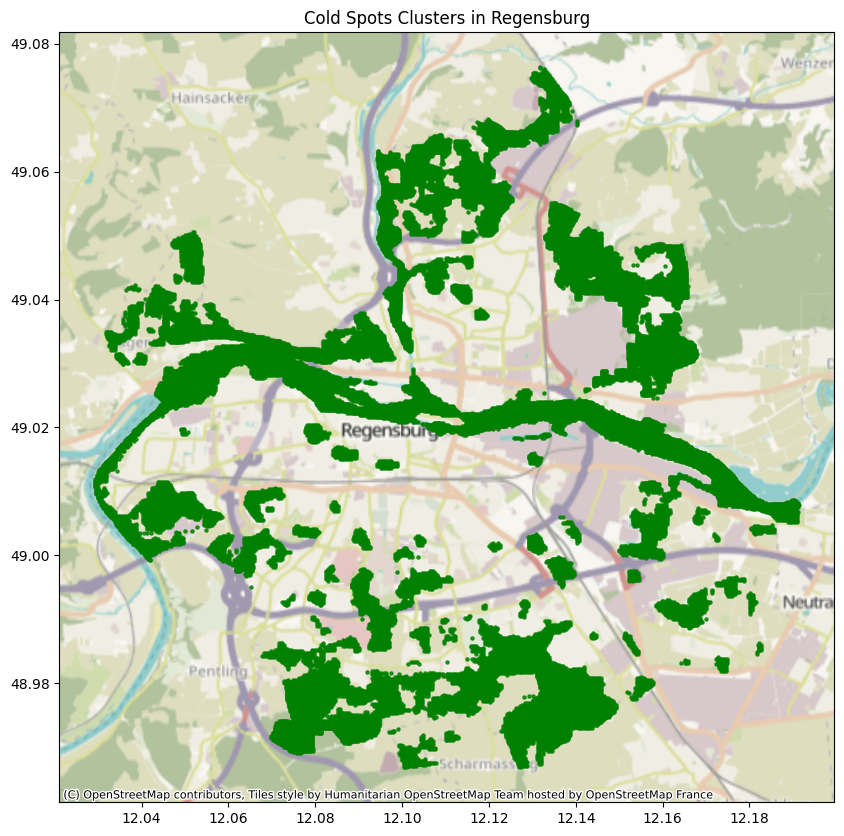

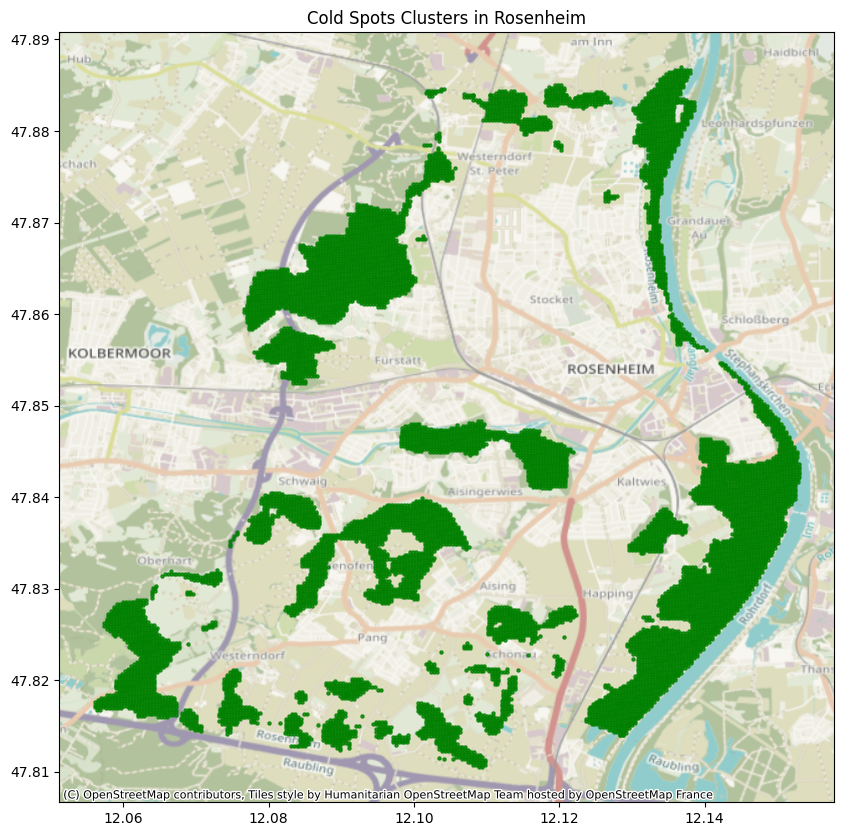

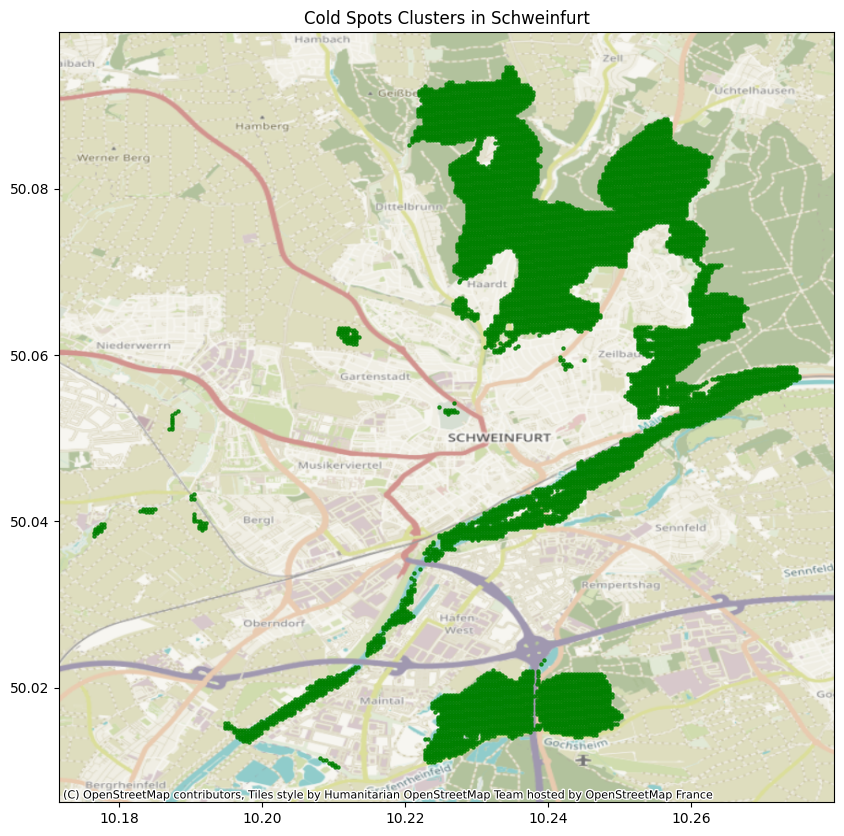

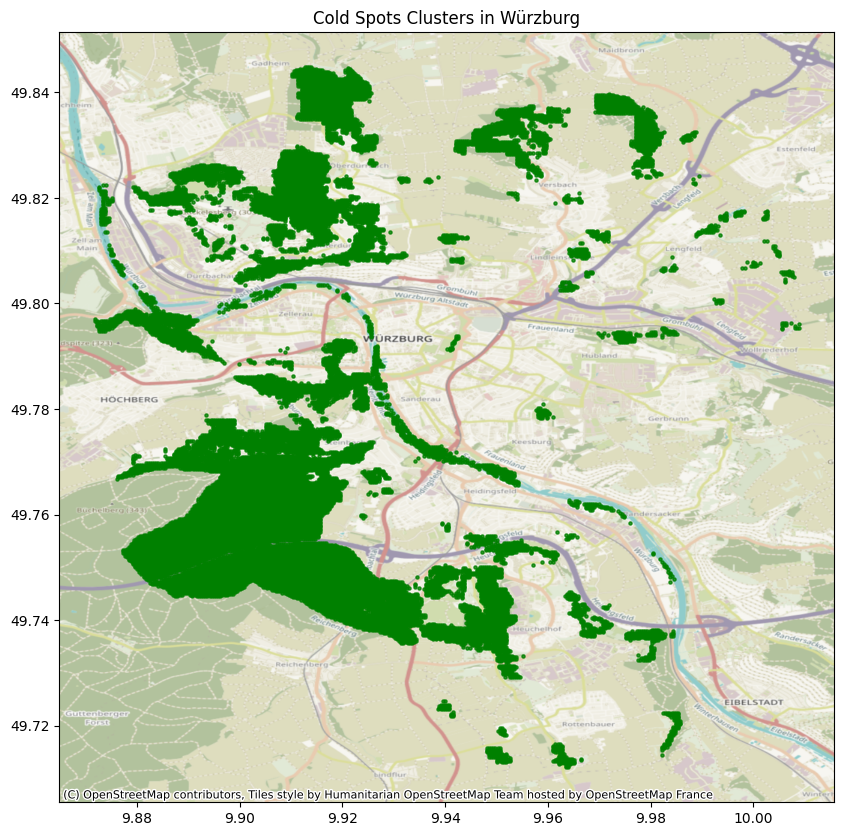

In [11]:
# Get unique cities from the cold_spots_gdf
cities = cold_spots_gdf['city'].unique()

# Iterate through each city and create a plot
for city in cities:
    # Filter the GeoDataFrame for the current city
    city_cold_spots = cold_spots_gdf[cold_spots_gdf['city'] == city].copy() # Create a copy to avoid SettingWithCopyWarning

    # Reproject to a suitable projected coordinate system (e.g., UTM Zone 32N for Bavaria)
    # EPSG: 25832 is ETRS89 / UTM zone 32N
    try:
        city_cold_spots_projected = city_cold_spots.to_crs(epsg=25832)
    except Exception as e:
        print(f"Could not reproject data for {city}: {e}")
        # Fallback to original CRS if reprojection fails
        city_cold_spots_projected = city_cold_spots


    # Create a plot for the city
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    ax.set_title(f'Cold Spots Clusters in {city}')

    # Plot the points in green with 80% transparency
    # Only plot points that are part of a cluster (cluster != -1)
    clustered_points = city_cold_spots_projected[city_cold_spots_projected['cluster'] != -1]
    ax.scatter(clustered_points.geometry.x, clustered_points.geometry.y,
               color='green', s=5, alpha=0.8)

    # Add a basemap (OpenStreetMap) - ensure the basemap CRS matches the data CRS
    try:
        ctx.add_basemap(ax, crs=city_cold_spots_projected.crs.to_epsg())
    except Exception as e:
         print(f"Could not add basemap for {city}: {e}")
         # If basemap fails, plot without it
         pass


    # Add city boundaries or other context if available and desired

    plt.show()

evtl. experimentieren mit anderen eps und min_sample Werten

evtl anpassen, sodass nur bebaute Gebiete betrachtet werden, sowie in https://www.mdpi.com/2072-4292/17/2/231#B56-remotesensing-17-00231


Kombinieren der Quartile-Cold-Spots mit LCZ Daten?

In [13]:
import contextily as cx
import geopandas as gpd
from xyzservices import TileProvider


lcz_map = TileProvider(
    url='https://lcz-generator.rub.de/tms/global-map-tiles/latest/{z}/{x}/{y}.png',
    html_attribution='&copy; <a href="https://doi.org/10.5194/essd-14-3835-2022">Matthias Demuzere et al. 2022</a>',
    attribution='© Matthias Demuzere et al. 2022. DOI: 10.5194/essd-14-3835-2022',
    min_zoom=2,
    max_zoom=13,
    name='Global LCZ Map',
    crs='EPSG:4326',
)

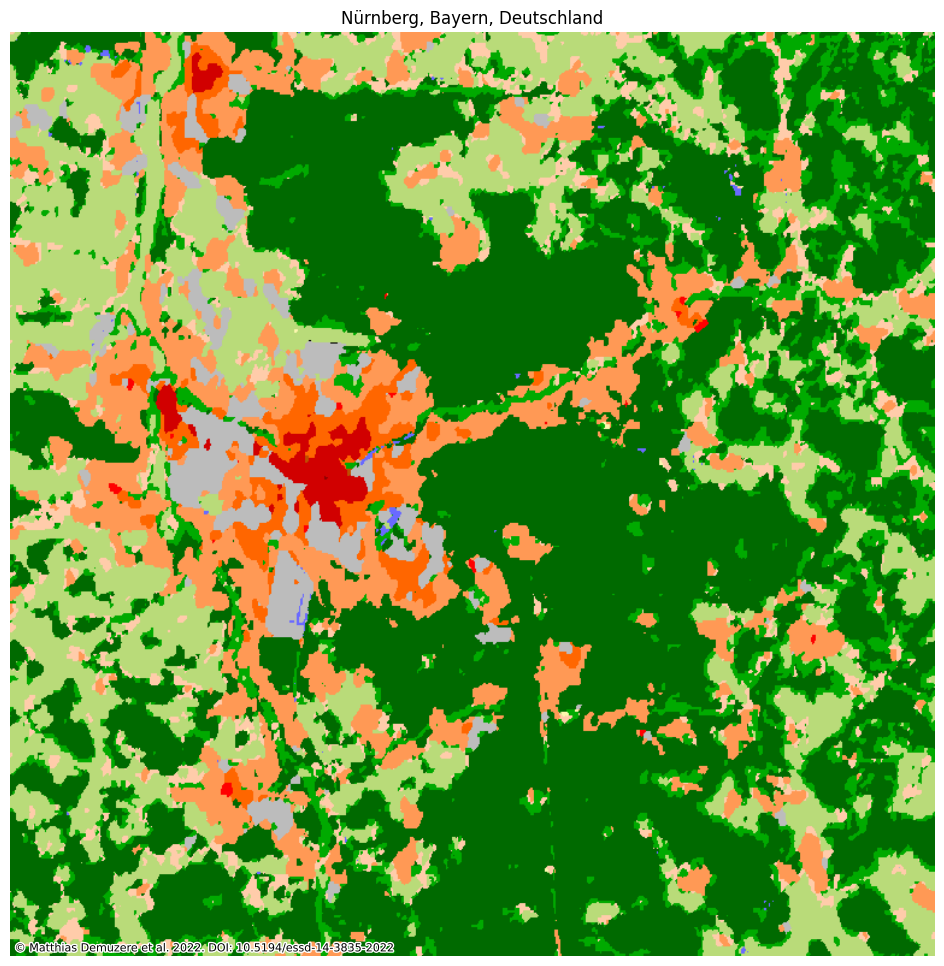

In [17]:
Nürnberg = cx.Place('Nuremberg', source=lcz_map, zoom=11)
ax = Nürnberg.plot()